# BUU AP preview

This notebook previews one BUU AP image together with the line annotations stored in the matching CSV file.

In [9]:
from pathlib import Path
from IPython.display import Image, display
import csv
import matplotlib.pyplot as plt

In [10]:
DIR_PATH = Path("/Users/gcpuppy/Documents/WorkSpaces/Spine-Opportunistic-Screening/dataset/BUU AP")

folder = /Users/gcpuppy/Documents/WorkSpaces/Spine-Opportunistic-Screening/dataset/BUU AP
Image Num = 400
First 5 images:


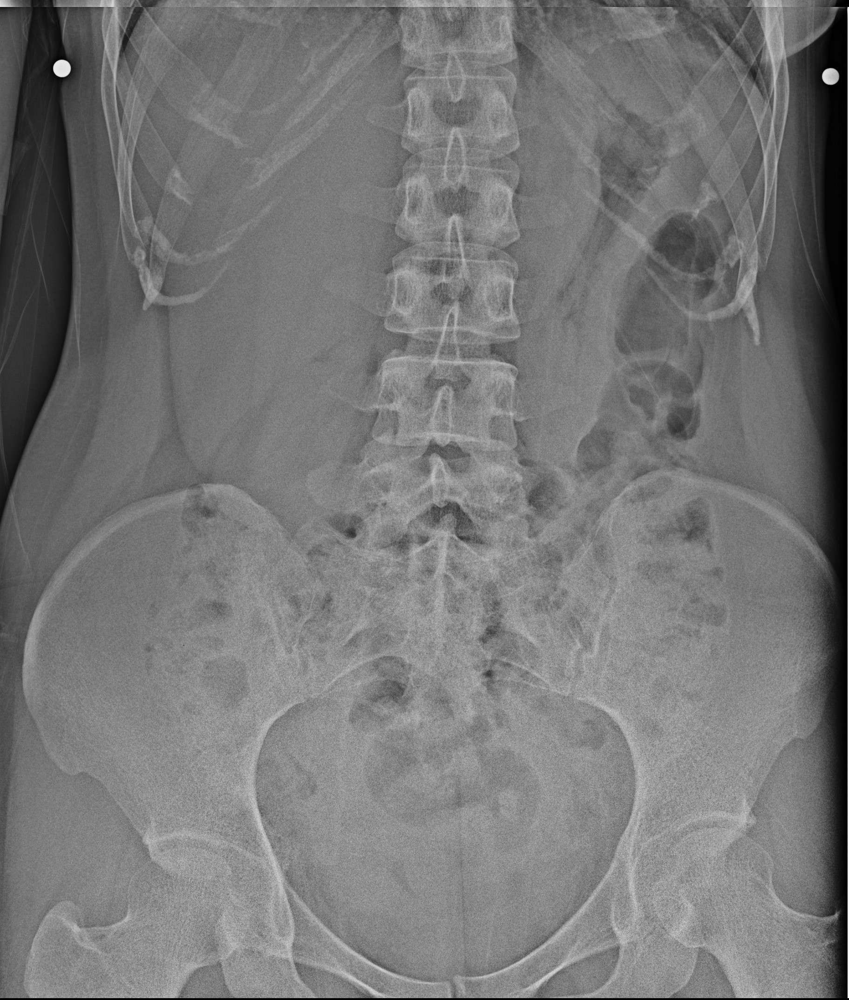

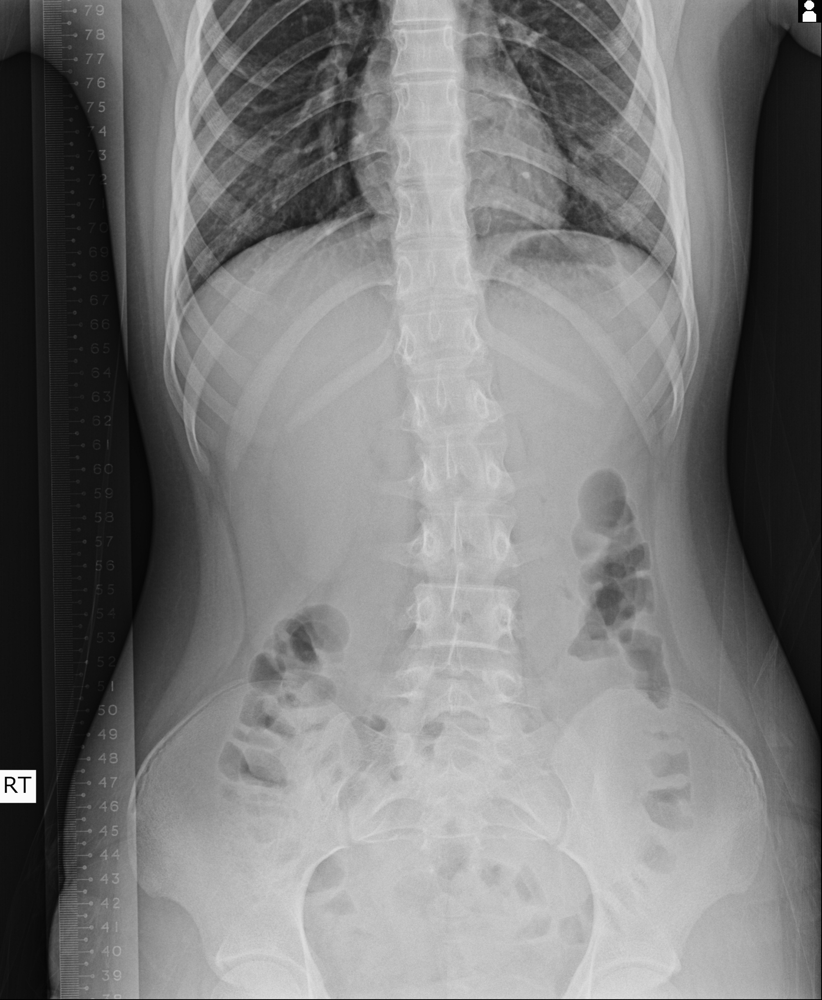

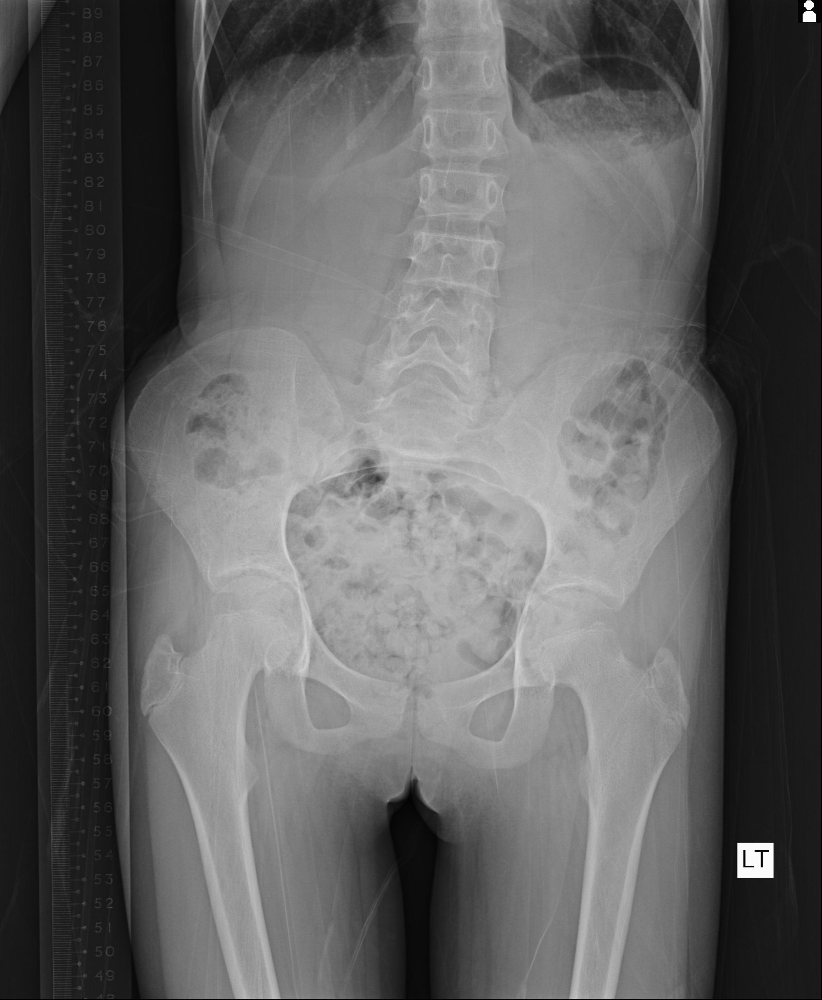

In [11]:
image_files = sorted(DIR_PATH.glob("*.jpg"))

print("folder =", DIR_PATH)
print("Image Num =", len(image_files))
print("First 5 images:")
for p in image_files[:3]:
    display(Image(filename=p))

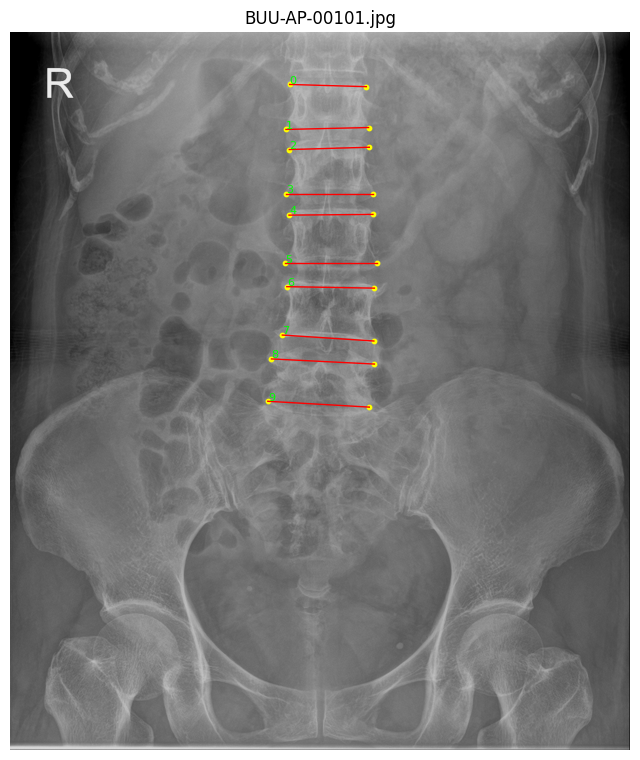

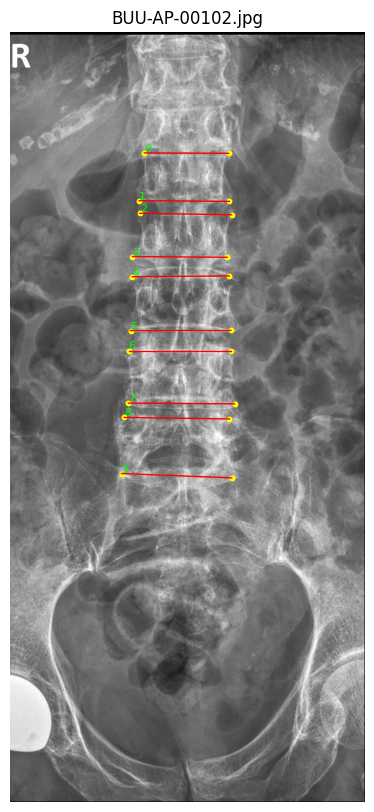

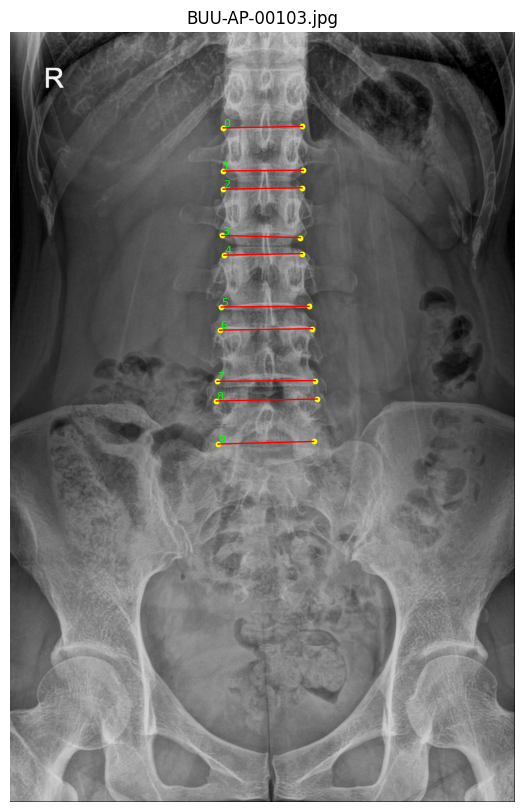

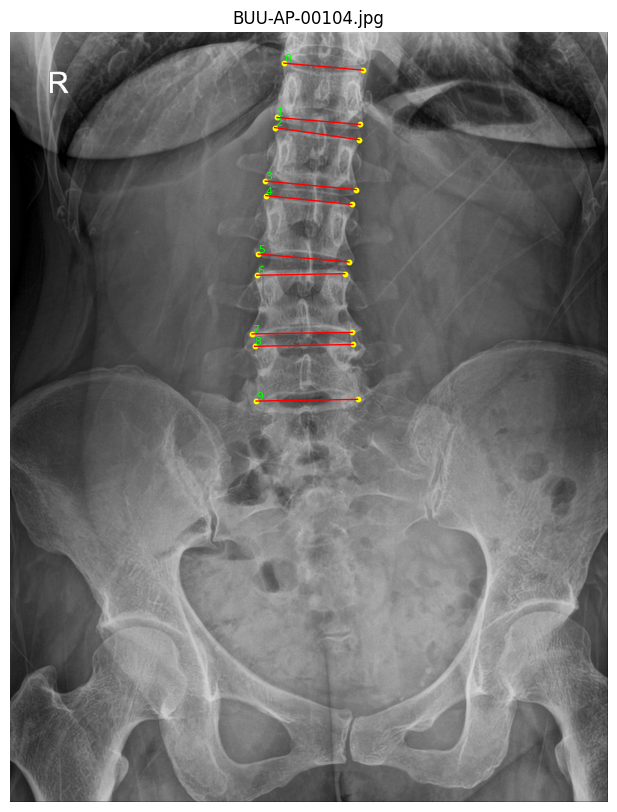

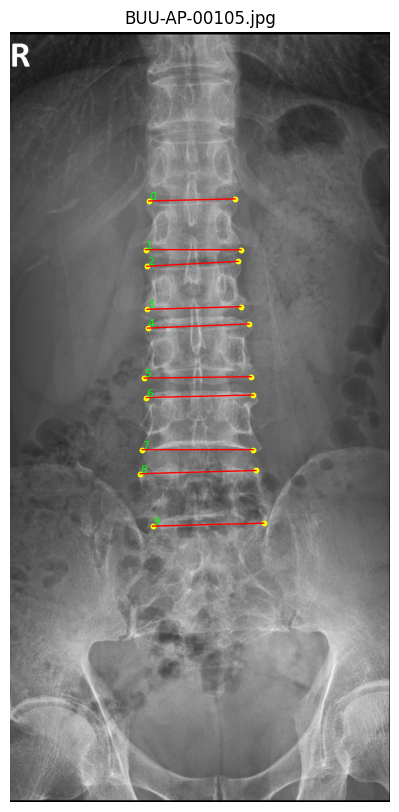

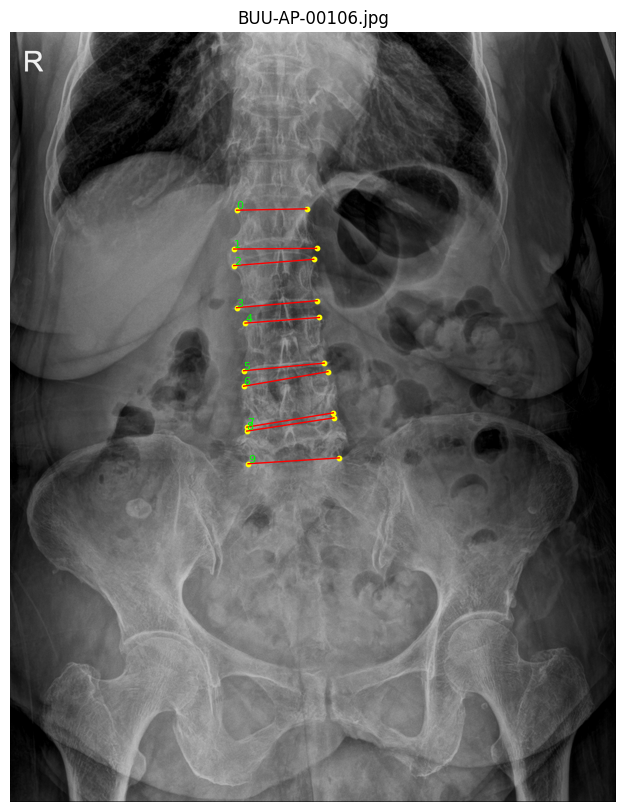

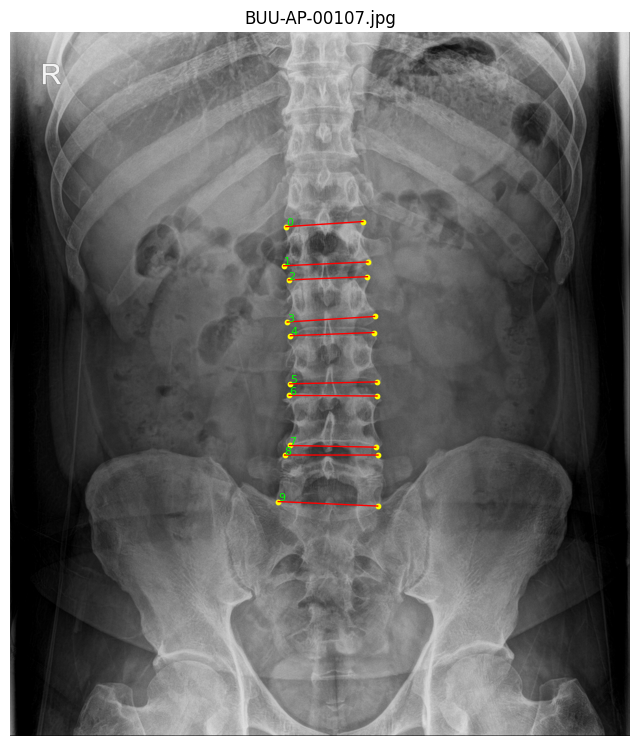

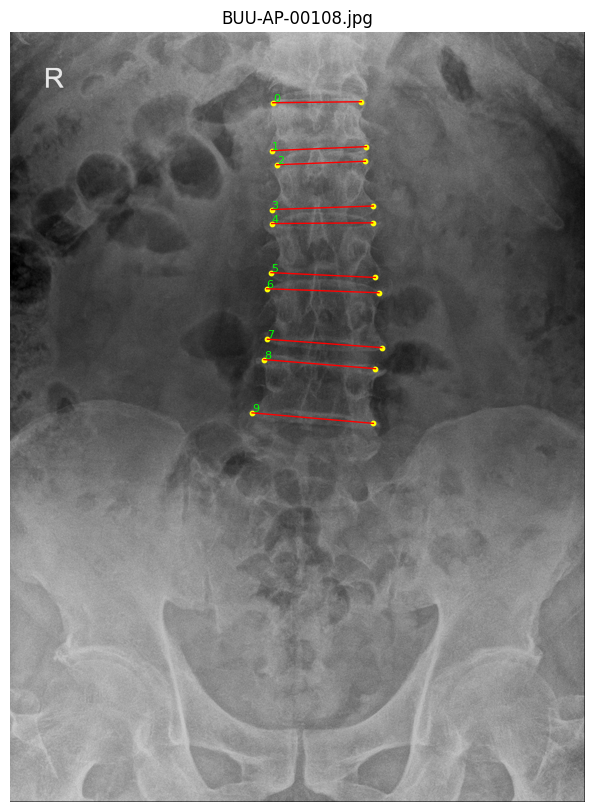

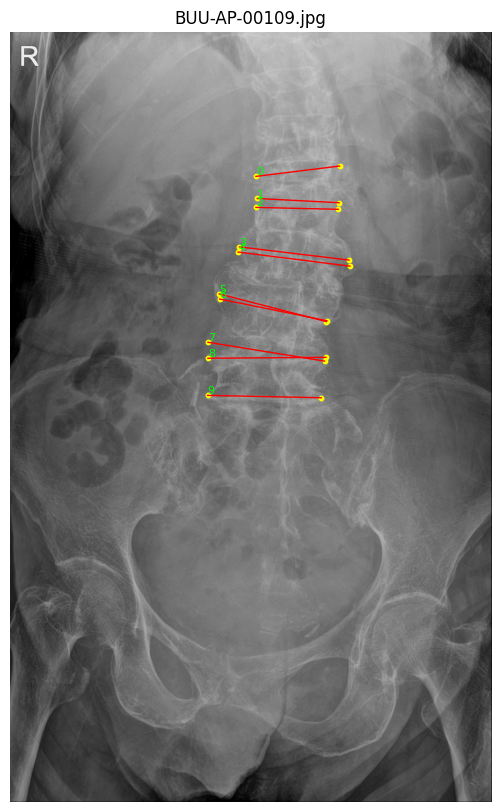

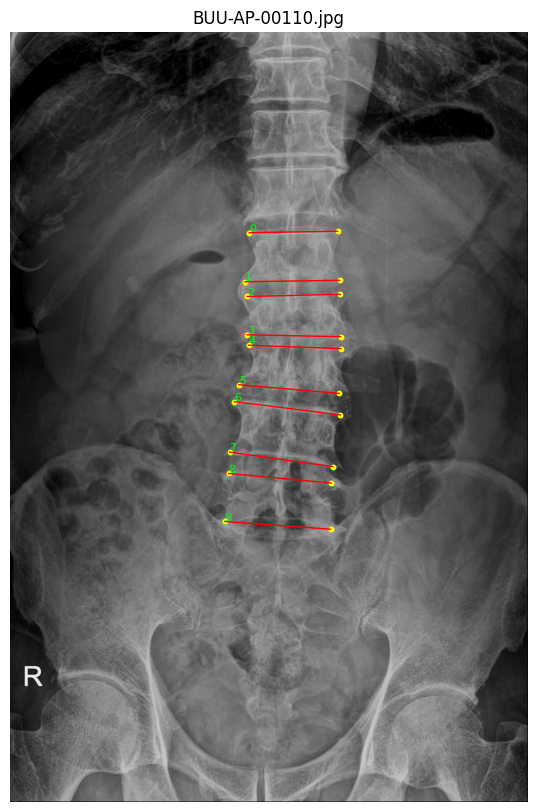

In [12]:
batch_num = 10
batch_size = 10

for _ in range(batch_num * batch_size, (batch_num + 1) * batch_size, 1):
    img_path = image_files[_]
    csv_path = img_path.with_suffix(".csv")

    img = plt.imread(img_path)


    annotations = []
    with open(csv_path, "r") as f:
        reader = csv.reader(f)
        for row in reader:
            x1, y1, x2, y2, label = row
            annotations.append([float(x1), float(y1), float(x2), float(y2), int(label)])

    plt.figure(figsize=(8, 10))
    plt.imshow(img, cmap="gray")

    for i, (x1, y1, x2, y2, label) in enumerate(annotations):
        plt.plot([x1, x2], [y1, y2], color="red", linewidth=1)
        plt.scatter([x1, x2], [y1, y2], color="yellow", s=10)
        plt.text(x1, y1 - 5, str(i), color="lime", fontsize=8)

    plt.title(img_path.name)
    plt.axis("off")
    plt.show()

In [13]:
csv_files = sorted(DIR_PATH.glob("*.csv"))

print("folder =", DIR_PATH)
print("CSV Num =", len(csv_files))

row_total = 0

for f in csv_files:
    print(f.name)
    n = 0
    with open(f, "r") as file:
        reader = csv.reader(file)
        n = len(list(reader))
        print("Number of rows =", n)

    row_total += n
        
print("Total rows in all CSV files =", row_total)
print("Total Vertebrae =", row_total / 2)

folder = /Users/gcpuppy/Documents/WorkSpaces/Spine-Opportunistic-Screening/dataset/BUU AP
CSV Num = 400
BUU-AP-00001.csv
Number of rows = 10
BUU-AP-00002.csv
Number of rows = 10
BUU-AP-00003.csv
Number of rows = 10
BUU-AP-00004.csv
Number of rows = 10
BUU-AP-00005.csv
Number of rows = 10
BUU-AP-00006.csv
Number of rows = 10
BUU-AP-00007.csv
Number of rows = 10
BUU-AP-00008.csv
Number of rows = 10
BUU-AP-00009.csv
Number of rows = 10
BUU-AP-00010.csv
Number of rows = 10
BUU-AP-00011.csv
Number of rows = 10
BUU-AP-00012.csv
Number of rows = 10
BUU-AP-00013.csv
Number of rows = 10
BUU-AP-00014.csv
Number of rows = 10
BUU-AP-00015.csv
Number of rows = 10
BUU-AP-00016.csv
Number of rows = 10
BUU-AP-00017.csv
Number of rows = 10
BUU-AP-00018.csv
Number of rows = 10
BUU-AP-00019.csv
Number of rows = 10
BUU-AP-00020.csv
Number of rows = 10
BUU-AP-00021.csv
Number of rows = 10
BUU-AP-00022.csv
Number of rows = 10
BUU-AP-00023.csv
Number of rows = 10
BUU-AP-00024.csv
Number of rows = 10
BUU-AP-0

# Mendeley PA Preview

In [5]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from pycocotools.coco import COCO
from IPython.display import Image, display

In [6]:
json_path = Path("/Users/gcpuppy/Documents/WorkSpaces/Spine-Opportunistic-Screening/dataset/Mendeley PA/_annotations.coco.json")
image_dir = json_path.parent
coco = COCO(str(json_path))

loading annotations into memory...
Done (t=0.08s)
creating index...
index created!


folder = /Users/gcpuppy/Documents/WorkSpaces/Spine-Opportunistic-Screening/dataset/Mendeley PA
Image Num = 1017


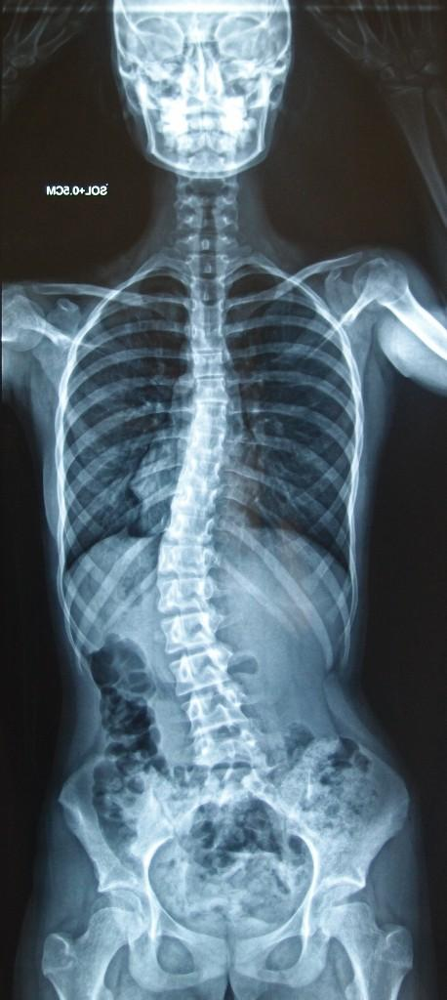

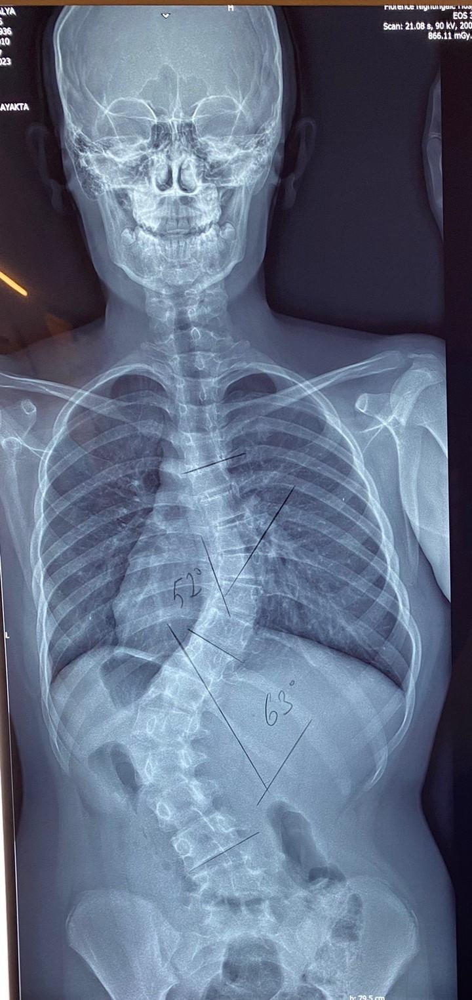

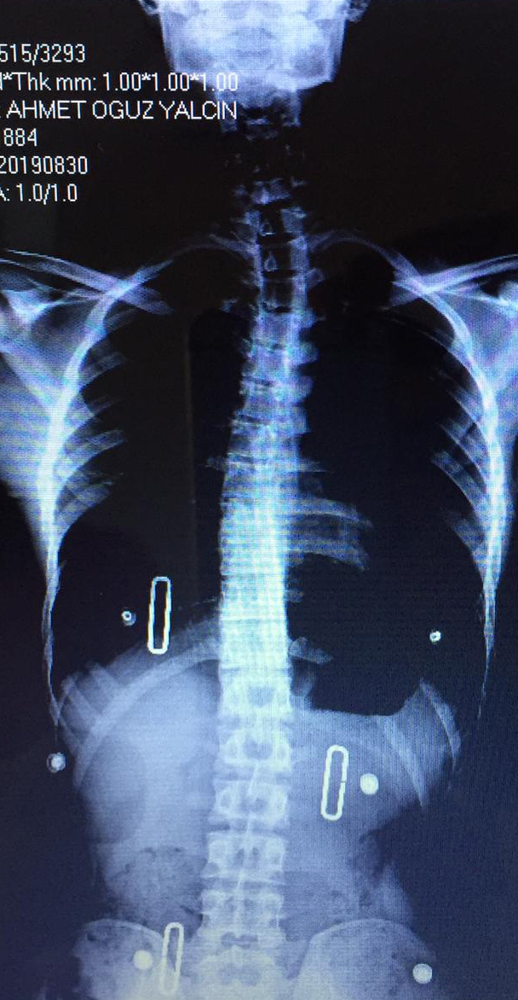

In [7]:
images = sorted(coco.dataset["images"], key=lambda x: x["id"])

print("folder =", image_dir)
print("Image Num =", len(images))

for p in images[:3]:
    display(Image(filename=str(image_dir / p["file_name"])))

In [8]:
def load_polygon_points(ann):
    segs = ann.get("segmentation") or []
    if not segs:
        return None
    seg = max(segs, key=len)  # use the longest polygon if present
    pts = np.array(seg, dtype=float).reshape(-1, 2)
    return pts if len(pts) >= 3 else None

def order_quad_points(pts):
    # convert 4 polygon points into tl, tr, bl, br for BUU-like labeling
    idx = np.argsort(pts[:, 1])
    top = pts[idx[:2]]
    bottom = pts[idx[2:4]]
    tl, tr = top[np.argsort(top[:, 0])]
    bl, br = bottom[np.argsort(bottom[:, 0])]
    return tl, tr, bl, br

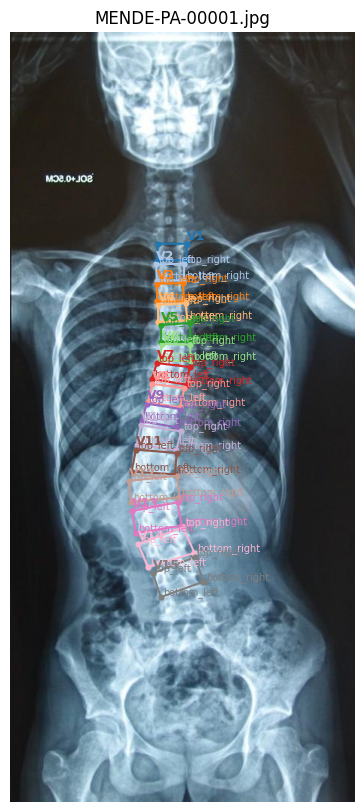

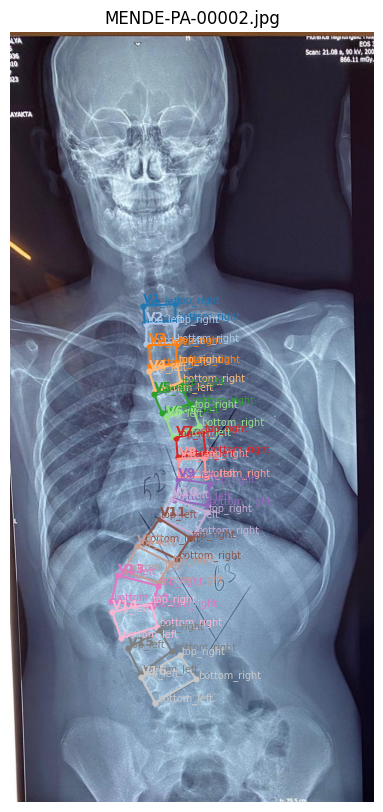

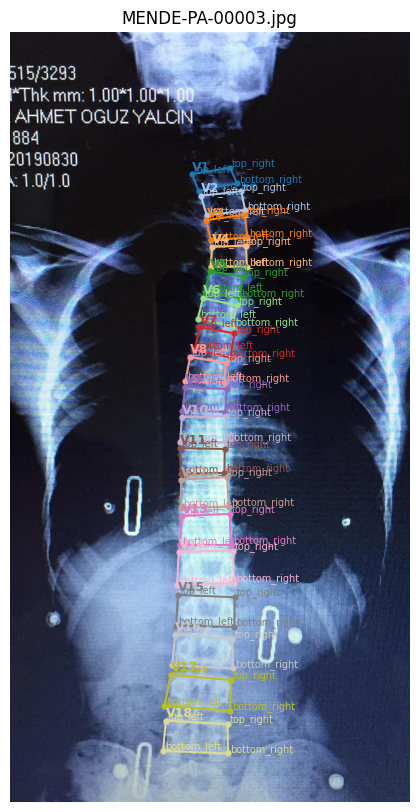

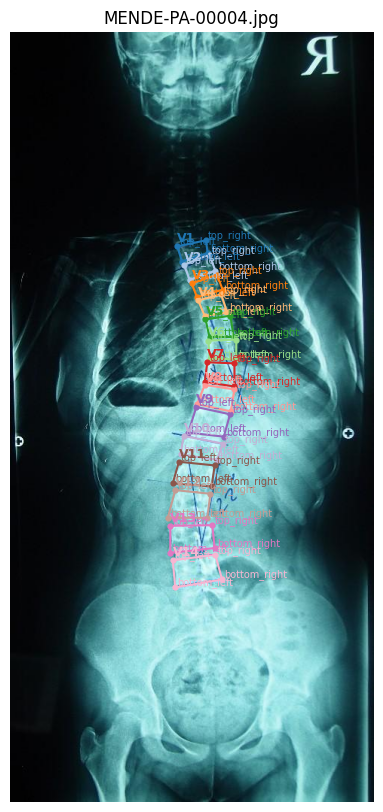

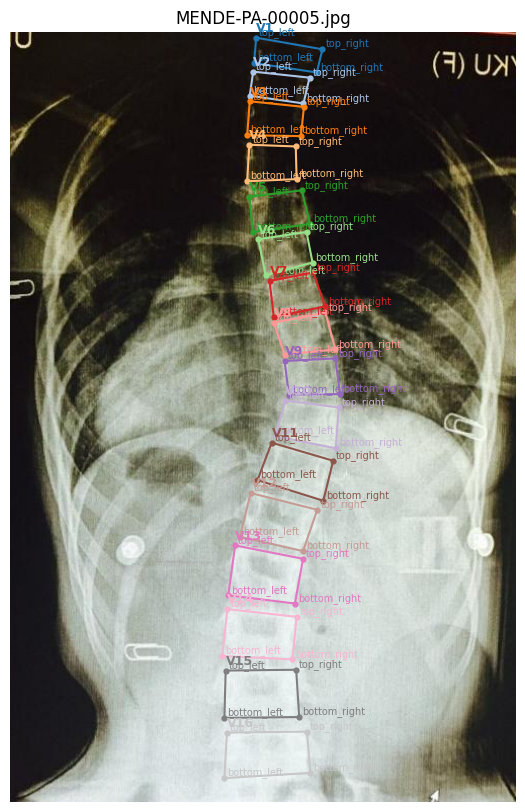

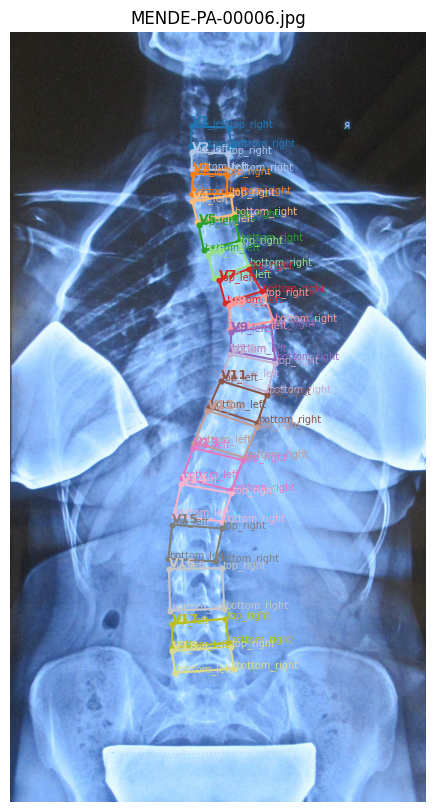

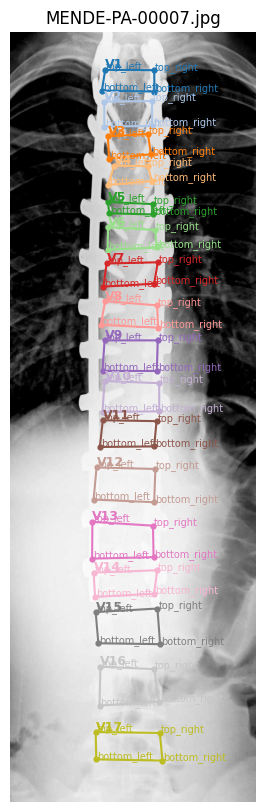

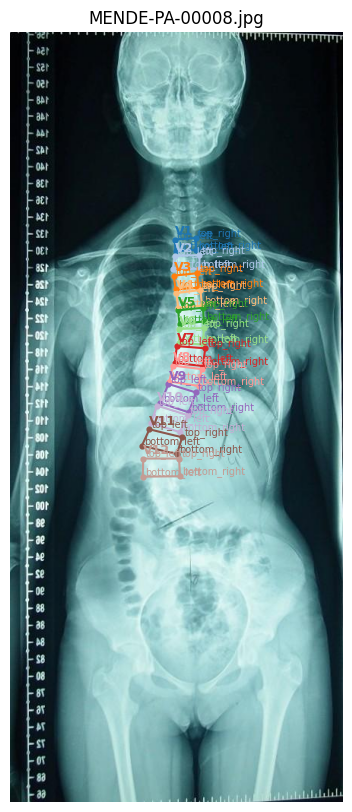

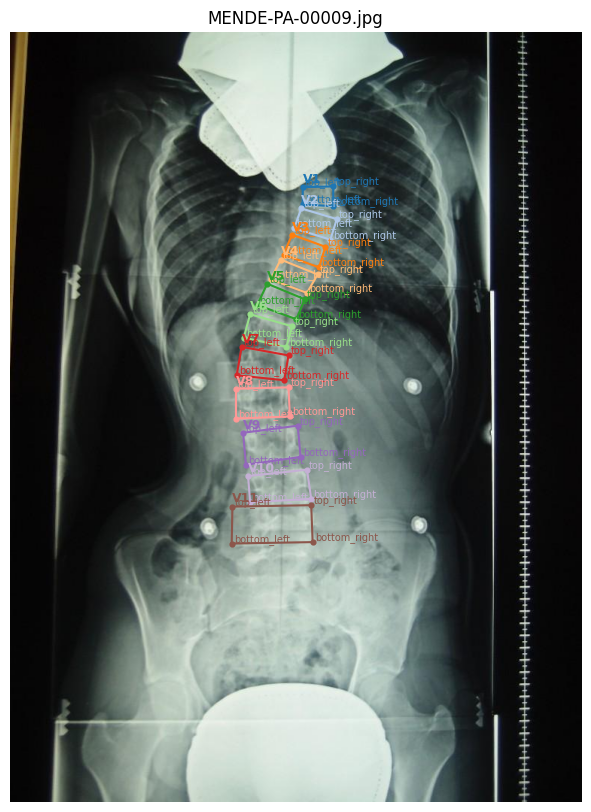

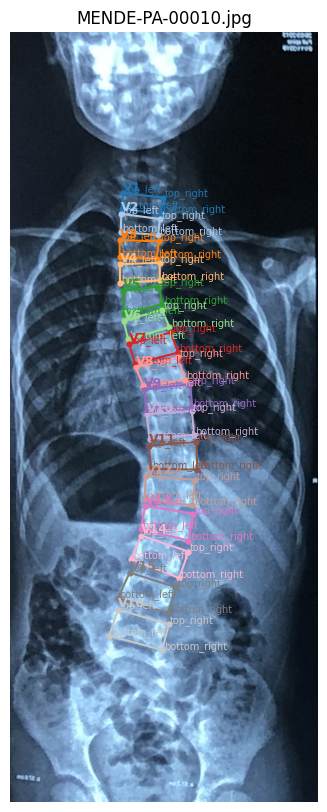

In [9]:
batch_num = 0
batch_size = 10

start = batch_num * batch_size
end = min((batch_num + 1) * batch_size, len(images))

for i in range(start, end):
    img_info = images[i]
    img_path = image_dir / img_info["file_name"]
    img = plt.imread(img_path)

    ann_ids = coco.getAnnIds(imgIds=[img_info["id"]])
    annotations = coco.loadAnns(ann_ids)
    annotations = sorted(
        annotations,
        key=lambda a: a["bbox"][1] + a["bbox"][3] / 2,  # top -> bottom
    )

    plt.figure(figsize=(8, 10))
    plt.imshow(img, cmap="gray")
    ax = plt.gca()

    for vertebra_index, ann in enumerate(annotations, start=1):
        color = plt.cm.tab20((vertebra_index - 1) % 20)
        pts = load_polygon_points(ann)

        if pts is not None:
            closed = np.vstack([pts, pts[0]])
            ax.plot(closed[:, 0], closed[:, 1], color=color, linewidth=1.5)
            ax.scatter(pts[:, 0], pts[:, 1], color=color, s=12)

            if len(pts) == 4:
                tl, tr, bl, br = order_quad_points(pts)
                for name, (x, y) in zip(
                    ["top_left", "top_right", "bottom_left", "bottom_right"],
                    [tl, tr, bl, br],
                ):
                    ax.text(x + 3, y - 3, name, color=color, fontsize=7)
                label_x, label_y = tl
            else:
                label_x, label_y = pts[np.argmin(pts[:, 1])]
        else:
            x, y, w, h = ann["bbox"]
            ax.add_patch(Rectangle((x, y), w, h, fill=False, edgecolor=color, linewidth=1.5))
            label_x, label_y = x, y

        ax.text(label_x, label_y - 6, f"V{vertebra_index}", color=color, fontsize=9, weight="bold")

    plt.title(img_info["file_name"])
    plt.axis("off")
    plt.show()

# MICCAI